<a href="https://colab.research.google.com/github/mishad01/Deep-Learning-and-Machine-Learning/blob/main/Thessis_Low_Light_Image_Enhancement_improvement.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Mounting Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
# Importing libraries
import os
import cv2
import random
import numpy as np
from glob import glob
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [3]:
# Set random seed for reproducibility
random.seed(10)

# Define image size and batch size
IMAGE_SIZE = 128
BATCH_SIZE = 4

In [4]:
# Helper function to read and preprocess an image
def read_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image.set_shape([None, None, 3])
    image = tf.cast(image, dtype=tf.float32) / 255.0
    return image

In [5]:
# Function for random cropping of images
def random_crop(low_image, enhanced_image):
    # Randomly choose crop coordinates
    low_image_shape = tf.shape(low_image)[:2]
    low_w = tf.random.uniform(
        shape=(), maxval=low_image_shape[1] - IMAGE_SIZE + 1, dtype=tf.int32
    )
    low_h = tf.random.uniform(
        shape=(), maxval=low_image_shape[0] - IMAGE_SIZE + 1, dtype=tf.int32
    )
    enhanced_w = low_w
    enhanced_h = low_h
    # Crop the images
    low_image_cropped = low_image[
        low_h : low_h + IMAGE_SIZE, low_w : low_w + IMAGE_SIZE
    ]
    enhanced_image_cropped = enhanced_image[
        enhanced_h : enhanced_h + IMAGE_SIZE, enhanced_w : enhanced_w + IMAGE_SIZE
    ]
    return low_image_cropped, enhanced_image_cropped

In [6]:
# Load and preprocess data
def load_data(low_light_image_path, enhanced_image_path):
    low_light_image = read_image(low_light_image_path)
    enhanced_image = read_image(enhanced_image_path)
    low_light_image, enhanced_image = random_crop(low_light_image, enhanced_image)
    return low_light_image, enhanced_image

In [7]:
# Create a dataset from file paths
def get_dataset(low_light_images, enhanced_images):
    dataset = tf.data.Dataset.from_tensor_slices((low_light_images, enhanced_images))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset

In [8]:
# Define file paths for training, validation, and test datasets
train_low_light_images = sorted(glob("/content/gdrive/MyDrive/Thesis Dataset/training-set/low/*"))
train_enhanced_images = sorted(glob("/content/gdrive/MyDrive/Thesis Dataset/training-set/high/*"))
val_low_light_images = sorted(glob("/content/gdrive/MyDrive/Thesis Dataset/validation-set/low/*"))
val_enhanced_images = sorted(glob("/content/gdrive/MyDrive/Thesis Dataset/validation-set/high/*"))
test_low_light_images = sorted(glob("/content/gdrive/MyDrive/Thesis Dataset/evaluation-set/low/*"))
test_enhanced_images = sorted(glob("/content/gdrive/MyDrive/Thesis Dataset/evaluation-set/high/*"))


In [9]:
# Create datasets for training and validation
train_dataset = get_dataset(train_low_light_images, train_enhanced_images)
val_dataset = get_dataset(val_low_light_images, val_enhanced_images)
print("Train Dataset:", train_dataset)
print("Val Dataset:", val_dataset)

Train Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(4, None, None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, None, None, 3), dtype=tf.float32, name=None))>
Val Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(4, None, None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, None, None, 3), dtype=tf.float32, name=None))>


In [10]:
# Define the selective kernel feature fusion function
def selective_kernel_feature_fusion(
    multi_scale_feature_1, multi_scale_feature_2, multi_scale_feature_3
):
    channels = list(multi_scale_feature_1.shape)[-1]
    combined_feature = layers.Add()(
        [multi_scale_feature_1, multi_scale_feature_2, multi_scale_feature_3]
    )
    gap = layers.GlobalAveragePooling2D()(combined_feature)
    # Fix: Use Lambda layer to wrap tf.reshape
    channel_wise_statistics = layers.Lambda(lambda x: tf.reshape(x, shape=(-1, 1, 1, channels)))(gap)
    compact_feature_representation = layers.Conv2D(
        filters=channels // 8, kernel_size=(1, 1), activation="relu"
    )(channel_wise_statistics)
    feature_descriptor_1 = layers.Conv2D(
        channels, kernel_size=(1, 1), activation="softmax"
    )(compact_feature_representation)
    feature_descriptor_2 = layers.Conv2D(
        channels, kernel_size=(1, 1), activation="softmax"
    )(compact_feature_representation)
    feature_descriptor_3 = layers.Conv2D(
        channels, kernel_size=(1, 1), activation="softmax"
    )(compact_feature_representation)
    feature_1 = multi_scale_feature_1 * feature_descriptor_1
    feature_2 = multi_scale_feature_2 * feature_descriptor_2
    feature_3 = multi_scale_feature_3 * feature_descriptor_3
    aggregated_feature = layers.Add()([feature_1, feature_2, feature_3])
    return aggregated_feature

In [11]:
# Define spatial attention block - FIXED VERSION
def spatial_attention_block(input_tensor):
    # Use Lambda layers instead of raw TensorFlow operations
    average_pooling = layers.Lambda(lambda x: tf.reduce_max(x, axis=-1, keepdims=True))(input_tensor)
    max_pooling = layers.Lambda(lambda x: tf.reduce_mean(x, axis=-1, keepdims=True))(input_tensor)
    concatenated = layers.Concatenate(axis=-1)([average_pooling, max_pooling])
    feature_map = layers.Conv2D(1, kernel_size=(1, 1), activation='sigmoid')(concatenated)
    return layers.Multiply()([input_tensor, feature_map])

In [12]:
# Define channel attention block - FIXED VERSION
def channel_attention_block(input_tensor):
    channels = list(input_tensor.shape)[-1]
    average_pooling = layers.GlobalAveragePooling2D()(input_tensor)
    # Use Lambda layer instead of tf.reshape
    feature_descriptor = layers.Lambda(lambda x: tf.reshape(x, shape=(-1, 1, 1, channels)))(average_pooling)
    feature_activations = layers.Conv2D(
        filters=channels // 8, kernel_size=(1, 1), activation="relu"
    )(feature_descriptor)
    feature_activations = layers.Conv2D(
        filters=channels, kernel_size=(1, 1), activation="sigmoid"
    )(feature_activations)
    return layers.Multiply()([input_tensor, feature_activations])

In [13]:
# Define dual attention unit block
def dual_attention_unit_block(input_tensor):
    channels = list(input_tensor.shape)[-1]
    feature_map = layers.Conv2D(
        channels, kernel_size=(3, 3), padding="same", activation="relu"
    )(input_tensor)
    feature_map = layers.Conv2D(channels, kernel_size=(3, 3), padding="same")(
        feature_map
    )
    channel_attention = channel_attention_block(feature_map)
    spatial_attention = spatial_attention_block(feature_map)
    concatenation = layers.Concatenate(axis=-1)([channel_attention, spatial_attention])
    concatenation = layers.Conv2D(channels, kernel_size=(1, 1))(concatenation)
    return layers.Add()([input_tensor, concatenation])

In [14]:
# Define down-sampling module
def down_sampling_module(input_tensor):
    channels = list(input_tensor.shape)[-1]
    main_branch = layers.Conv2D(channels, kernel_size=(1, 1), activation="relu")(
        input_tensor
    )
    main_branch = layers.Conv2D(
        channels, kernel_size=(3, 3), padding="same", activation="relu"
    )(main_branch)
    main_branch = layers.MaxPooling2D()(main_branch)
    main_branch = layers.Conv2D(channels * 2, kernel_size=(1, 1))(main_branch)
    skip_branch = layers.MaxPooling2D()(input_tensor)
    skip_branch = layers.Conv2D(channels * 2, kernel_size=(1, 1))(skip_branch)
    return layers.Add()([skip_branch, main_branch])


In [15]:
# Define up-sampling module
def up_sampling_module(input_tensor):
    channels = list(input_tensor.shape)[-1]
    main_branch = layers.Conv2D(channels, kernel_size=(1, 1), activation="relu")(
        input_tensor
    )
    main_branch = layers.Conv2D(
        channels, kernel_size=(3, 3), padding="same", activation="relu"
    )(main_branch)
    main_branch = layers.UpSampling2D()(main_branch)
    main_branch = layers.Conv2D(channels // 2, kernel_size=(1, 1))(main_branch)
    skip_branch = layers.UpSampling2D()(input_tensor)
    skip_branch = layers.Conv2D(channels // 2, kernel_size=(1, 1))(skip_branch)
    return layers.Add()([skip_branch, main_branch])


In [16]:
# Define multi-scale residual block
def multi_scale_residual_block(input_tensor, channels):
    """Multi-scale Residual Block with proper Keras layers"""
    # Multi-scale features
    level1 = input_tensor
    level2 = down_sampling_module(input_tensor)
    level3 = down_sampling_module(level2)

    # Dual Attention Units
    level1_dau = dual_attention_unit_block(level1)
    level2_dau = dual_attention_unit_block(level2)
    level3_dau = dual_attention_unit_block(level3)

    # Selective Kernel Feature Fusion
    level1_skff = selective_kernel_feature_fusion(
        level1_dau,
        up_sampling_module(level2_dau),
        up_sampling_module(up_sampling_module(level3_dau)),
    )
    level2_skff = selective_kernel_feature_fusion(
        down_sampling_module(level1_dau),
        level2_dau,
        up_sampling_module(level3_dau)
    )
    level3_skff = selective_kernel_feature_fusion(
        down_sampling_module(down_sampling_module(level1_dau)),
        down_sampling_module(level2_dau),
        level3_dau,
    )

    # Second Dual Attention Units
    level1_dau_2 = dual_attention_unit_block(level1_skff)
    level2_dau_2 = up_sampling_module(dual_attention_unit_block(level2_skff))
    level3_dau_2 = up_sampling_module(up_sampling_module(dual_attention_unit_block(level3_skff)))

    # Final Selective Kernel Feature Fusion
    skff_ = selective_kernel_feature_fusion(level1_dau_2, level2_dau_2, level3_dau_2)
    conv = layers.Conv2D(channels, kernel_size=(3, 3), padding="same")(skff_)

    return layers.Add()([input_tensor, conv])

In [17]:
# Define recursive residual group
def recursive_residual_group(input_tensor, num_mrb, channels):
    conv1 = layers.Conv2D(channels, kernel_size=(3, 3), padding="same")(input_tensor)
    for _ in range(num_mrb):
        conv1 = multi_scale_residual_block(conv1, channels)
    conv2 = layers.Conv2D(channels, kernel_size=(3, 3), padding="same")(conv1)
    return layers.Add()([conv2, input_tensor])

In [18]:
# Define the MIRNet model architecture
def mirnet_model(num_rrg, num_mrb, channels):
    input_tensor = keras.Input(shape=[None, None, 3])
    x1 = layers.Conv2D(channels, kernel_size=(3, 3), padding="same")(input_tensor)
    for _ in range(num_rrg):
        x1 = recursive_residual_group(x1, num_mrb, channels)
    conv = layers.Conv2D(3, kernel_size=(3, 3), padding="same")(x1)
    output_tensor = layers.Add()([input_tensor, conv])
    return keras.Model(input_tensor, output_tensor)

In [19]:
# Define custom loss function (Charbonnier loss) and PSNR metric
def charbonnier_loss(y_true, y_pred):
    return tf.reduce_mean(tf.sqrt(tf.square(y_true - y_pred) + tf.square(1e-3)))

def peak_signal_noise_ratio(y_true, y_pred):
    return tf.image.psnr(y_pred, y_true, max_val=255.0)

In [20]:
# Instantiate the model
NUM_RRG = 3      # number of recursive residual groups
NUM_MRB = 2      # number of multi-scale residual blocks per group
CHANNELS = 64    # base number of channels

model = mirnet_model(num_rrg=NUM_RRG, num_mrb=NUM_MRB, channels=CHANNELS)

In [21]:
# Compile the model
optimizer = keras.optimizers.Adam(learning_rate=1e-4)
model.compile(
    optimizer=optimizer, loss=charbonnier_loss, metrics=[peak_signal_noise_ratio]
)

In [22]:
# Train the model
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=30,
    callbacks=[
        keras.callbacks.ReduceLROnPlateau(
            monitor="val_peak_signal_noise_ratio",
            factor=0.5,
            patience=5,
            verbose=1,
            min_delta=1e-7,
            mode="max",
        )
    ],
)

Epoch 1/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 547s 4s/step - loss: 0.2218 - peak_signal_noise_ratio: 61.4654 - val_loss: 0.1498 - val_peak_signal_noise_ratio: 64.9208 - learning_rate: 1.0000e-04
Epoch 2/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 36s 476ms/step - loss: 0.1627 - peak_signal_noise_ratio: 63.7624 - val_loss: 0.1441 - val_peak_signal_noise_ratio: 64.9089 - learning_rate: 1.0000e-04
Epoch 3/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 35s 472ms/step - loss: 0.1546 - peak_signal_noise_ratio: 64.0266 - val_loss: 0.1428 - val_peak_signal_noise_ratio: 64.9874 - learning_rate: 1.0000e-04
Epoch 4/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 35s 471ms/step - loss: 0.1467 - peak_signal_noise_ratio: 64.6824 - val_loss: 0.1679 - val_peak_signal_noise_ratio: 63.8506 - learning_rate: 1.0000e-04
Epoch 5/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 37s 496ms/step - loss: 0.1576 - peak_signal_noise_ratio: 64.2228 - val_loss: 0.1357 - val_peak_signal_noise_ratio: 65.5147 - learning_rate: 1.0000e-04
Epoch 6/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 35s 471ms/step - lo

In [23]:
# Save the trained model
model.save("./gdrive/My Drive/image-enhancement/enhancement_model.h5")
print("Model saved!")

Model saved!


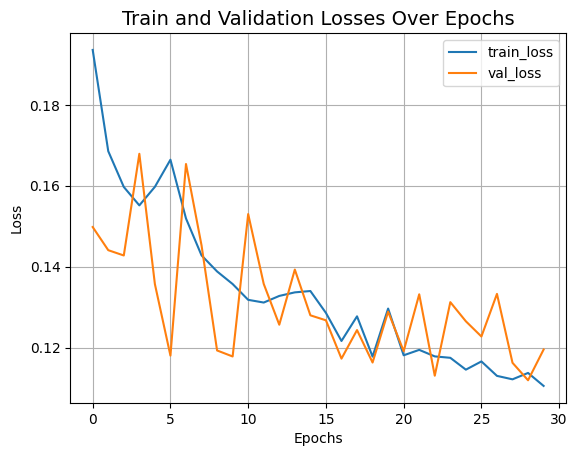

In [24]:
# Plot training and validation loss
plt.plot(history.history["loss"], label="train_loss")
plt.plot(history.history["val_loss"], label="val_loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Train and Validation Losses Over Epochs", fontsize=14)
plt.legend()
plt.grid()
plt.show()

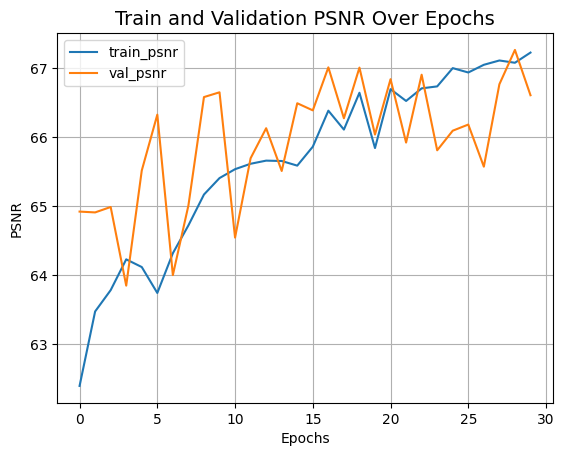

In [25]:
# Plot training and validation PSNR
plt.plot(history.history["peak_signal_noise_ratio"], label="train_psnr")
plt.plot(history.history["val_peak_signal_noise_ratio"], label="val_psnr")
plt.xlabel("Epochs")
plt.ylabel("PSNR")
plt.title("Train and Validation PSNR Over Epochs", fontsize=14)
plt.legend()
plt.grid()
plt.show()

In [26]:
# Define a function to plot original, enhanced, and PIL autocontrast images
def plot_results(images, titles, figure_size=(12, 12)):
    fig = plt.figure(figsize=figure_size)
    for i in range(len(images)):
        fig.add_subplot(1, len(images), i + 1).set_title(titles[i])
        _ = plt.imshow(images[i])
        plt.axis("off")
    plt.show()

In [27]:
# Define a function to perform image enhancement using the trained model
def infer(original_image):
    image = keras.utils.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output = model.predict(image)
    output_image = output[0] * 255.0
    output_image = output_image.clip(0, 255)
    output_image = output_image.reshape(
        (np.shape(output_image)[0], np.shape(output_image)[1], 3)
    )
    output_image = Image.fromarray(np.uint8(output_image))
    original_image = Image.fromarray(np.uint8(original_image))
    return output_image

1/1 ━━━━━━━━━━━━━━━━━━━━ 24s 24s/step


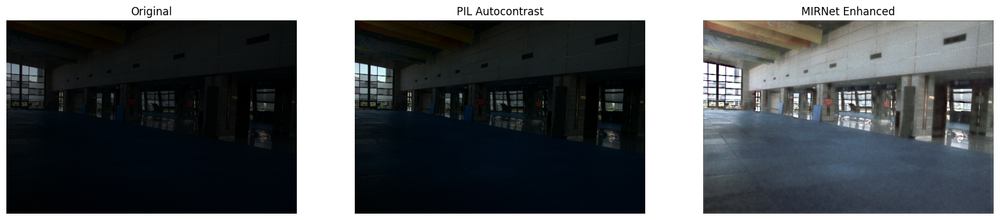

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


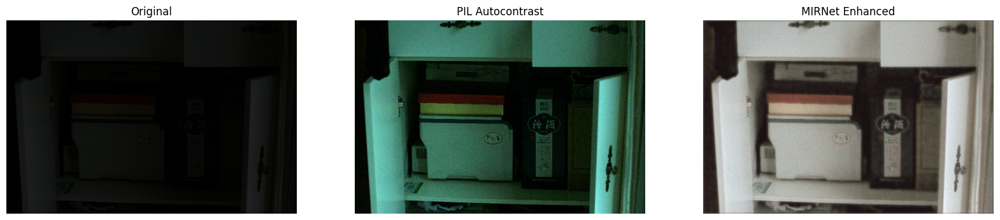

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


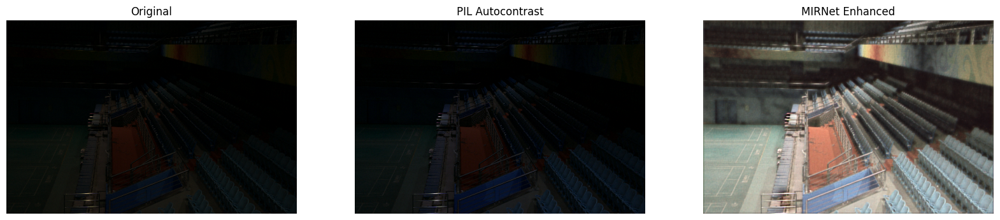

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


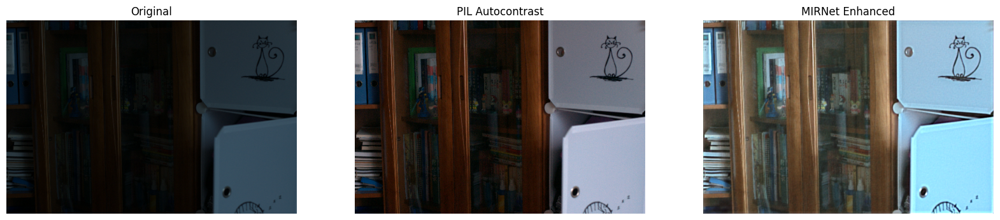

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


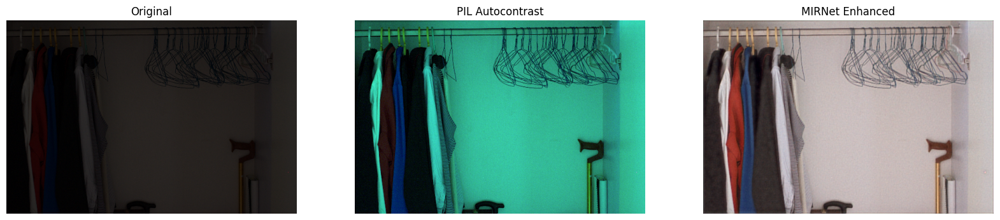

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


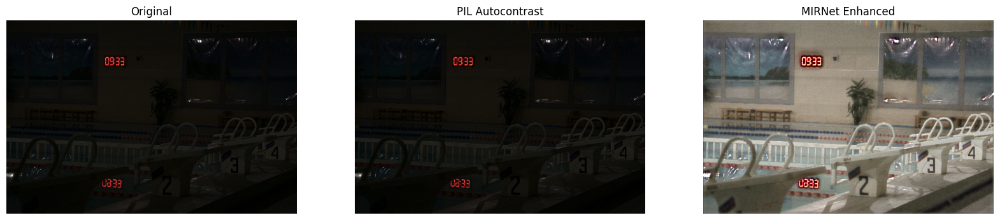

In [28]:
# Generate enhanced images from test images and display results
for low_light_image in random.sample(test_low_light_images, 6):
    original_image = Image.open(low_light_image)
    enhanced_image = infer(original_image)
    plot_results(
        [original_image, ImageOps.autocontrast(original_image), enhanced_image],
        ["Original", "PIL Autocontrast", "MIRNet Enhanced"],
        (20, 12),
    )

# 🔧 Drop‑in: Better losses, metrics & training callbacks

This section was auto‑added to give you **easy, no‑theory** upgrades:
- **Combined loss** = Charbonnier + SSIM + color‑constancy + exposure control + TV
- **Metrics** = PSNR + SSIM
- **Training callbacks** = ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard
- **Reproducibility** = fixed random seed

> You can run these cells at the end of your current workflow without changing your architecture or datasets.


In [29]:

# --- Reproducibility & combined loss (run after your imports/model build) ---
import os, random, numpy as np, tensorflow as tf

SEED = 42
random.seed(SEED); np.random.seed(SEED); tf.random.set_seed(SEED)
os.environ["TF_DETERMINISTIC_OPS"] = "1"

# SSIM metric/loss (assumes inputs in [0,1])
def ssim_metric(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

def ssim_loss(y_true, y_pred):
    return 1.0 - ssim_metric(y_true, y_pred)

# Color-constancy (gray-world) keeps RGB channel balance
def color_constancy_loss(y_pred):
    r = tf.reduce_mean(y_pred[..., 0], axis=[1, 2])
    g = tf.reduce_mean(y_pred[..., 1], axis=[1, 2])
    b = tf.reduce_mean(y_pred[..., 2], axis=[1, 2])
    return tf.reduce_mean((r - g)**2 + (r - b)**2 + (g - b)**2)

# Exposure control (Zero-DCE style): push mean intensity toward a target
def exposure_loss(y_pred, target=0.6):
    y_gray = tf.image.rgb_to_grayscale(y_pred)
    mean = tf.reduce_mean(y_gray, axis=[1, 2, 3])
    return tf.reduce_mean((mean - target)**2)

# Total variation for slight smoothness (reduce blotchy artifacts)
def tv_loss(y_pred):
    return tf.reduce_mean(tf.image.total_variation(y_pred))

# ---- Keep your existing charbonnier_loss(y_true, y_pred) defined earlier ----
# ---- Keep your existing peak_signal_noise_ratio(...) metric defined earlier ----

# Combine losses with gentle weights (safe defaults; adjust later if desired)
ALPHA, BETA, GAMMA = 0.1, 0.01, 0.001  # ssim, color, tv
DELTA = 0.05                            # exposure

def combined_loss(y_true, y_pred):
    return (
        charbonnier_loss(y_true, y_pred)
        + ALPHA * ssim_loss(y_true, y_pred)
        + BETA  * color_constancy_loss(y_pred)
        + GAMMA * tv_loss(y_pred)
        + DELTA * exposure_loss(y_pred, target=0.6)
    )

# Re-compile the model with Adam(1e-4) and add SSIM metric
try:
    _ = model  # check that a model object exists
except NameError:
    print("Note: 'model' not found. Build/assign your model to the variable 'model' and re-run this cell.")
else:
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
    model.compile(optimizer=optimizer,
                  loss=combined_loss,
                  metrics=[peak_signal_noise_ratio, ssim_metric])
    print("✅ Model recompiled with combined loss, PSNR + SSIM; LR=1e-4.")


✅ Model recompiled with combined loss, PSNR + SSIM; LR=1e-4.


In [30]:
import datetime
import os
import tensorflow as tf

os.makedirs("checkpoints", exist_ok=True)
ckpt_path = os.path.join("checkpoints", "best_psnr.weights.h5")  # <-- fixed

ckpt = tf.keras.callbacks.ModelCheckpoint(
    ckpt_path,
    monitor="val_peak_signal_noise_ratio",
    mode="max",
    save_best_only=True,
    save_weights_only=True,
    verbose=1,
)

es = tf.keras.callbacks.EarlyStopping(
    monitor="val_peak_signal_noise_ratio",
    mode="max",
    patience=10,
    restore_best_weights=True,
    verbose=1,
)

rlr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_peak_signal_noise_ratio",
    mode="max",
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1,
)

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tb = tf.keras.callbacks.TensorBoard(log_dir=logdir)

CALLBACKS = [ckpt, es, rlr, tb]
print("✅ Callbacks ready. Best weights will be saved to:", ckpt_path)
print("TensorBoard logs:", logdir)


✅ Callbacks ready. Best weights will be saved to: checkpoints/best_psnr.weights.h5
TensorBoard logs: logs/20250828-130919


In [31]:
from glob import glob

# Simple dataset loader that avoids map() issues
def make_dataset(low_glob, high_glob, batch_size=BATCH_SIZE):
    low_files = sorted(glob(low_glob))
    high_files = sorted(glob(high_glob))

    ds = tf.data.Dataset.from_tensor_slices((low_files, high_files))

    def _load(low_path, high_path):
        low_img = read_image(low_path)   # your tf.io based function
        high_img = read_image(high_path)
        low_img, high_img = random_crop(low_img, high_img)
        return low_img, high_img

    # Use map with tf.py_function so TF won’t complain about Python ops
    ds = ds.map(lambda x, y: tf.py_function(
        func=_load, inp=[x, y], Tout=[tf.float32, tf.float32]
    ), num_parallel_calls=tf.data.AUTOTUNE)

    ds = ds.shuffle(1000).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

# Now actually build the datasets
train_dataset = make_dataset(
    "/content/gdrive/MyDrive/Dataset/train/low/*.png",
    "/content/gdrive/MyDrive/Dataset/train/high/*.png"
)

val_dataset = make_dataset(
    "/content/gdrive/MyDrive/Dataset/val/low/*.png",
    "/content/gdrive/MyDrive/Dataset/val/high/*.png"
)


In [32]:
def make_dataset(low_glob, high_glob, batch_size=BATCH_SIZE):
    low_files = sorted(glob(low_glob))
    high_files = sorted(glob(high_glob))

    ds = tf.data.Dataset.from_tensor_slices((low_files, high_files))

    def _load(low_path, high_path):
        low_img = read_image(low_path.numpy().decode("utf-8"))
        high_img = read_image(high_path.numpy().decode("utf-8"))
        low_img, high_img = random_crop(low_img, high_img)
        return low_img, high_img

    def _tf_load(low_path, high_path):
        low_img, high_img = tf.py_function(
            func=_load, inp=[low_path, high_path], Tout=[tf.float32, tf.float32]
        )
        # 🔑 Set static shape so Keras knows dimensions
        low_img.set_shape([IMAGE_SIZE, IMAGE_SIZE, 3])
        high_img.set_shape([IMAGE_SIZE, IMAGE_SIZE, 3])
        return low_img, high_img

    ds = ds.map(_tf_load, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.shuffle(1000).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds


In [41]:
# Use in-memory model if available
try:
    _ = model  # will raise NameError if not defined
    print("✅ Using in-memory model; no need to load from disk.")
except NameError:
    raise RuntimeError("`model` is not defined. Run the training/build cell first or save+load below.")


✅ Using in-memory model; no need to load from disk.


✅ Using in-memory model; no loading from disk.
🧭 Attention-like layers: ['conv2d_13', 'conv2d_14', 'conv2d_19']


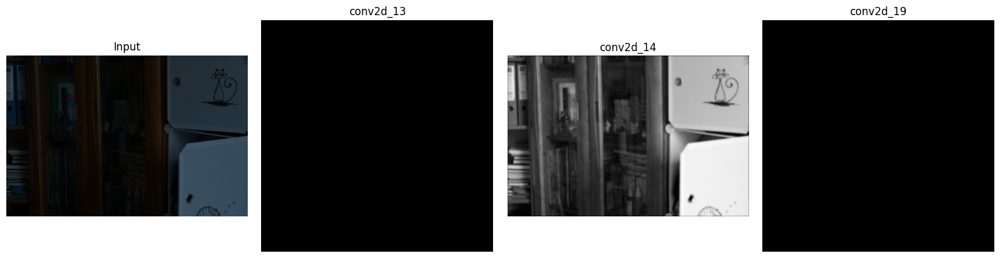

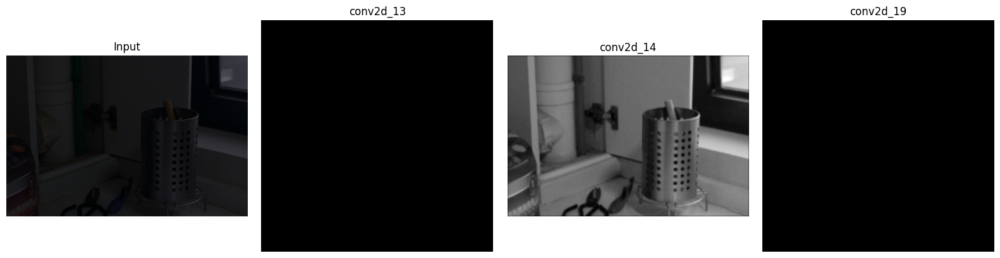

In [43]:
from tensorflow import keras
import tensorflow as tf, numpy as np, matplotlib.pyplot as plt
from glob import glob
import os

TEST_LOW = "/content/gdrive/MyDrive/Thesis Dataset/evaluation-set/low"

def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    return img

# --- Use the in-memory model that you already trained ---
try:
    _ = model
    print("✅ Using in-memory model; no loading from disk.")
except NameError:
    raise RuntimeError("`model` is not defined. Run the training/build cell first or save+load a .keras model and then re-run this cell.")

# --- Find attention-like layers robustly ---
def find_attention_like_layers(m):
    names = []
    for lyr in m.layers:
        cfg = getattr(lyr, "get_config", lambda: {})()
        act = getattr(lyr, "activation", None)
        act_name = getattr(act, "__name__", "") if act else ""
        # Normalize kernel_size from list/tuple to tuple
        k = cfg.get("kernel_size", None)
        if isinstance(k, list): k = tuple(k)

        is_gate = act_name in ("sigmoid", "softmax") and k == (1, 1)
        if is_gate:
            names.append(lyr.name)
    # Keep it short
    return names[:3]

attention_layer_names = find_attention_like_layers(model)

# Fallback if nothing matched: pick last few Conv2D layers just to visualize feature maps
if not attention_layer_names:
    attention_layer_names = [l.name for l in model.layers if isinstance(l, keras.layers.Conv2D)][-3:]
    print("⚠️ No 1x1 sigmoid/softmax gates found. Falling back to last Conv2D layers:", attention_layer_names)
else:
    print("🧭 Attention-like layers:", attention_layer_names)

# --- Build a sub-model to fetch those activations ---
sub = keras.Model(inputs=model.input,
                  outputs=[model.get_layer(n).output for n in attention_layer_names])

# --- Take 2 samples and plot input + maps ---
paths = sorted(glob(os.path.join(TEST_LOW, "*")))[:2]
for p in paths:
    x = load_img(p)
    feats = sub(tf.expand_dims(x,0), training=False)
    feats = [f[0].numpy() for f in feats]  # remove batch

    fig, axs = plt.subplots(1, len(feats)+1, figsize=(4*(len(feats)+1), 4))
    axs[0].imshow(x); axs[0].set_title("Input"); axs[0].axis("off")

    for i, att in enumerate(feats, 1):
        # reduce channels → a single heatmap
        if att.ndim == 3 and att.shape[-1] > 1:
            att_map = np.mean(att, axis=-1)
        else:
            att_map = att[...,0] if att.ndim == 3 else att
        axs[i].imshow(att_map, cmap="gray")
        axs[i].set_title(f"{attention_layer_names[i-1]}")
        axs[i].axis("off")
    plt.tight_layout(); plt.show()


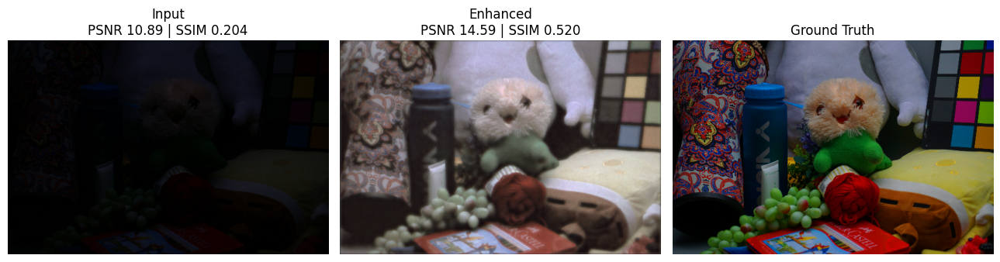

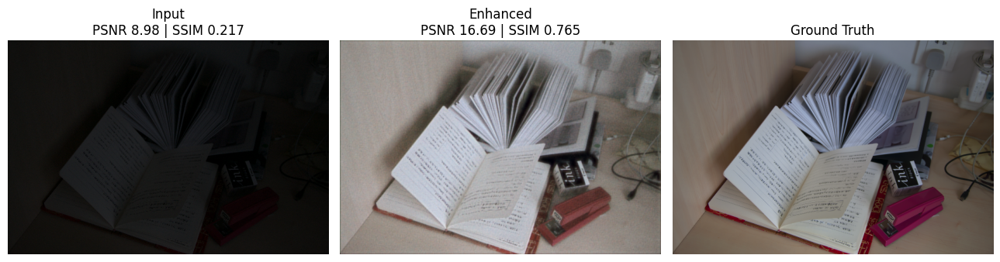

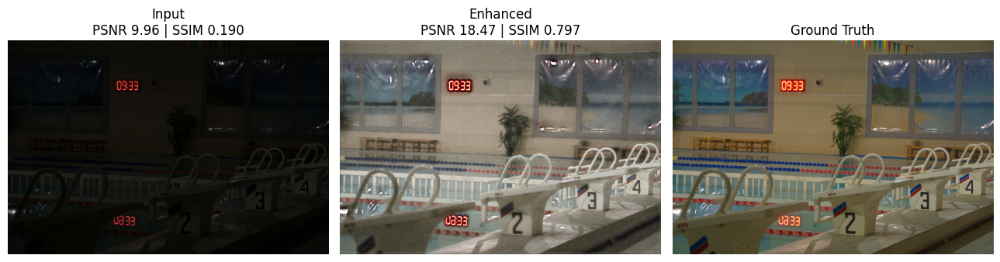

In [44]:
# Input vs Enhanced vs GT with metrics
from glob import glob
import random

TEST_LOW = "/content/gdrive/MyDrive/Thesis Dataset/evaluation-set/low"
TEST_HIGH = "/content/gdrive/MyDrive/Thesis Dataset/evaluation-set/high"

def psnr(a, b): return tf.image.psnr(a, b, max_val=1.0).numpy().item()
def ssim(a, b): return tf.image.ssim(a, b, max_val=1.0).numpy().item()

lows  = sorted(glob(os.path.join(TEST_LOW, "*")))
highs = sorted(glob(os.path.join(TEST_HIGH, "*")))
pairs = list(zip(lows, highs))

def predict_img(m, img):
    y = m.predict(tf.expand_dims(img,0), verbose=0)[0]
    return tf.clip_by_value(y, 0.0, 1.0)

for low_p, high_p in random.sample(pairs, min(3, len(pairs))):
    low = load_img(low_p)
    gt  = load_img(high_p)
    out = predict_img(model, low)

    in_psnr, in_ssim   = psnr(gt, low), ssim(gt, low)
    out_psnr, out_ssim = psnr(gt, out), ssim(gt, out)

    fig, axs = plt.subplots(1, 3, figsize=(13,4))
    axs[0].imshow(low); axs[0].set_title(f"Input\nPSNR {in_psnr:.2f} | SSIM {in_ssim:.3f}"); axs[0].axis("off")
    axs[1].imshow(out); axs[1].set_title(f"Enhanced\nPSNR {out_psnr:.2f} | SSIM {out_ssim:.3f}"); axs[1].axis("off")
    axs[2].imshow(gt);  axs[2].set_title("Ground Truth"); axs[2].axis("off")
    plt.tight_layout(); plt.show()


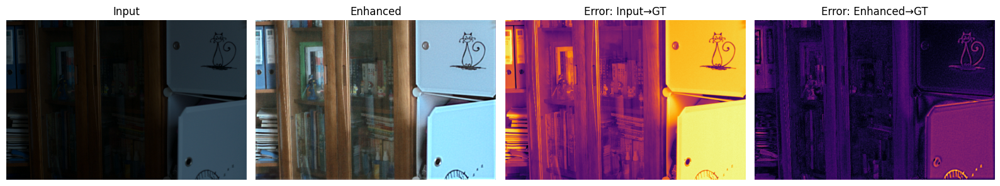

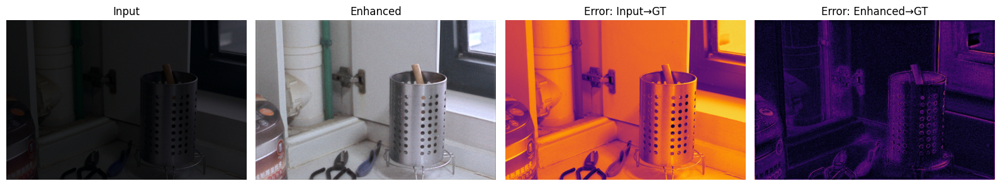

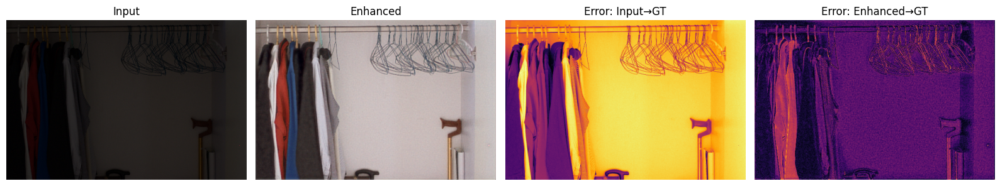

In [45]:
import tensorflow as tf, numpy as np, matplotlib.pyplot as plt, os
from glob import glob

TEST_LOW  = "/content/gdrive/MyDrive/Thesis Dataset/evaluation-set/low"
TEST_HIGH = "/content/gdrive/MyDrive/Thesis Dataset/evaluation-set/high"

def load_img(path):
    x = tf.io.read_file(path)
    x = tf.image.decode_png(x, channels=3)
    return tf.image.convert_image_dtype(x, tf.float32)  # [0,1]

def predict_img(model, img):
    y = model.predict(tf.expand_dims(img,0), verbose=0)[0]
    return tf.clip_by_value(y, 0.0, 1.0)

def abs_err(a, b):  # per-pixel MAE map
    return tf.reduce_mean(tf.abs(a - b), axis=-1)  # [H,W]

pairs = list(zip(sorted(glob(os.path.join(TEST_LOW, "*"))),
                 sorted(glob(os.path.join(TEST_HIGH, "*")))))

for low_p, gt_p in pairs[:3]:
    low = load_img(low_p)
    gt  = load_img(gt_p)
    out = predict_img(model, low)

    in_err  = abs_err(low, gt).numpy()
    out_err = abs_err(out, gt).numpy()

    fig, axs = plt.subplots(1,4, figsize=(16,4))
    axs[0].imshow(low); axs[0].set_title("Input"); axs[0].axis("off")
    axs[1].imshow(out); axs[1].set_title("Enhanced"); axs[1].axis("off")
    im2 = axs[2].imshow(in_err, cmap="inferno"); axs[2].set_title("Error: Input→GT"); axs[2].axis("off")
    im3 = axs[3].imshow(out_err, cmap="inferno"); axs[3].set_title("Error: Enhanced→GT"); axs[3].axis("off")
    plt.tight_layout(); plt.show()


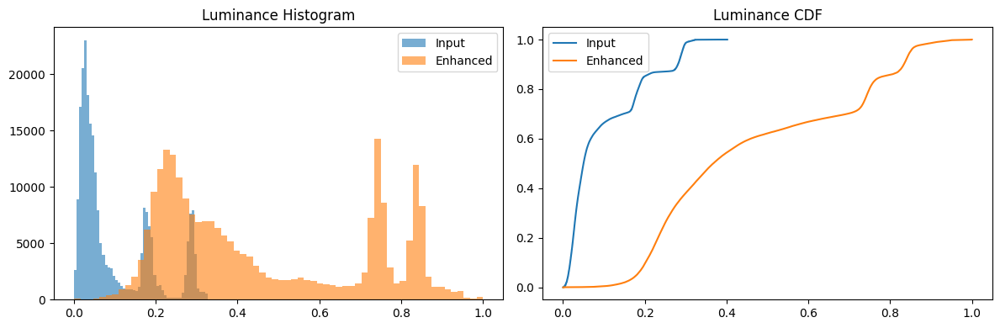

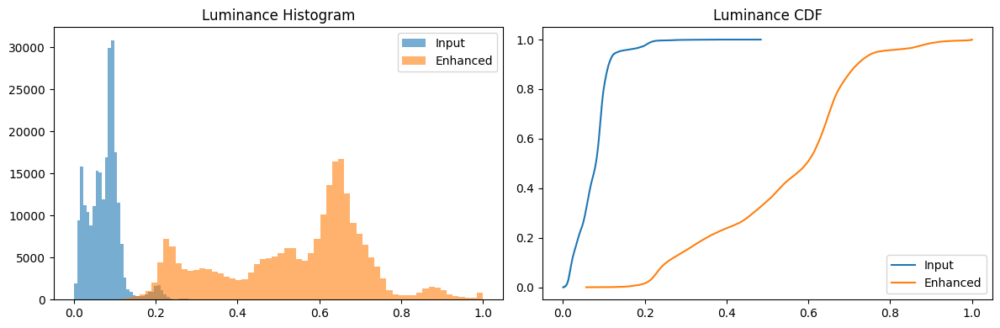

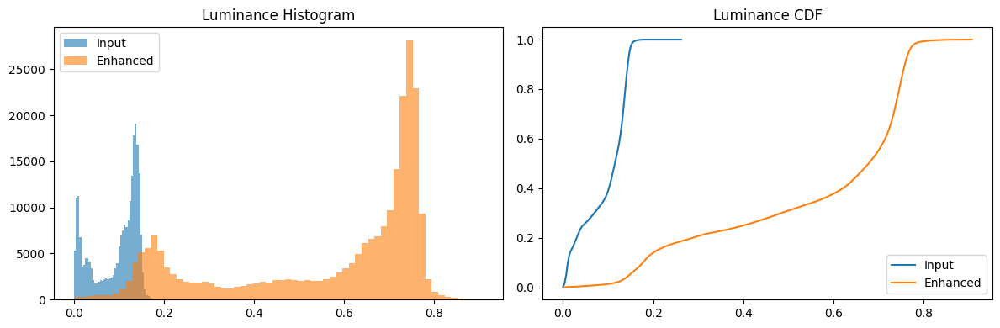

In [46]:
import numpy as np, matplotlib.pyplot as plt, tensorflow as tf, os
from glob import glob

TEST_LOW = "/content/gdrive/MyDrive/Thesis Dataset/evaluation-set/low"

def load_img(p):
    x = tf.io.read_file(p); x = tf.image.decode_png(x, 3)
    return tf.image.convert_image_dtype(x, tf.float32)

def luminance(img):  # Rec. 709
    r,g,b = img[...,0], img[...,1], img[...,2]
    return 0.2126*r + 0.7152*g + 0.0722*b

def predict_img(model, img):
    y = model.predict(tf.expand_dims(img,0), verbose=0)[0]
    return tf.clip_by_value(y, 0.0, 1.0)

for p in sorted(glob(os.path.join(TEST_LOW, "*")))[:3]:
    low = load_img(p)
    out = predict_img(model, low)

    y_low = luminance(low).numpy().ravel()
    y_out = luminance(out).numpy().ravel()

    fig = plt.figure(figsize=(12,4))
    # Histograms
    ax1 = fig.add_subplot(1,2,1)
    ax1.hist(y_low, bins=64, alpha=0.6, label="Input")
    ax1.hist(y_out, bins=64, alpha=0.6, label="Enhanced")
    ax1.set_title("Luminance Histogram"); ax1.legend()

    # CDFs
    ax2 = fig.add_subplot(1,2,2)
    for y,lab in [(y_low,"Input"), (y_out,"Enhanced")]:
        ys = np.sort(y); cdf = np.linspace(0,1,len(ys))
        ax2.plot(ys, cdf, label=lab)
    ax2.set_title("Luminance CDF"); ax2.legend()
    plt.tight_layout(); plt.show()


Δcolor (lower is better): input= 0.023769236629282323  enhanced= 0.07354156254329826


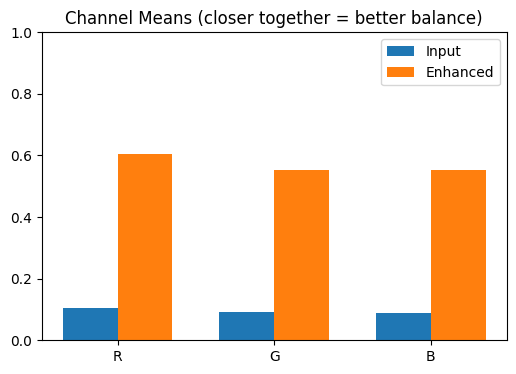

In [47]:
import numpy as np, matplotlib.pyplot as plt, tensorflow as tf

def channel_means(img):  # img in [0,1]
    return [float(tf.reduce_mean(img[...,i])) for i in range(3)]

def color_delta(means):  # distance from perfect gray
    r,g,b = means
    return np.sqrt((r-g)**2 + (r-b)**2 + (g-b)**2)

def barplot_color(means_in, means_out):
    x = np.arange(3); w = 0.35
    plt.figure(figsize=(6,4))
    plt.bar(x-w/2, means_in,  width=w, label="Input")
    plt.bar(x+w/2, means_out, width=w, label="Enhanced")
    plt.xticks(x, ["R","G","B"]); plt.ylim(0,1)
    plt.title("Channel Means (closer together = better balance)")
    plt.legend(); plt.show()

# Example on one sample already loaded as 'low' and 'out'
# (If not, reuse load+predict from the previous cells)
means_in  = channel_means(low)
means_out = channel_means(out)
print("Δcolor (lower is better): input=", color_delta(means_in), " enhanced=", color_delta(means_out))
barplot_color(means_in, means_out)


In [48]:
import cv2, numpy as np, matplotlib.pyplot as plt, tensorflow as tf

def lap_var(img):  # img [0,1]
    g = tf.image.rgb_to_grayscale(img).numpy()
    g8 = (g*255).astype(np.uint8)
    return float(cv2.Laplacian(g8, cv2.CV_64F).var())

lv_in  = lap_var(low)
lv_out = lap_var(out)
print(f"Variance of Laplacian — Input: {lv_in:.2f} | Enhanced: {lv_out:.2f}")


Variance of Laplacian — Input: 119.13 | Enhanced: 527.76


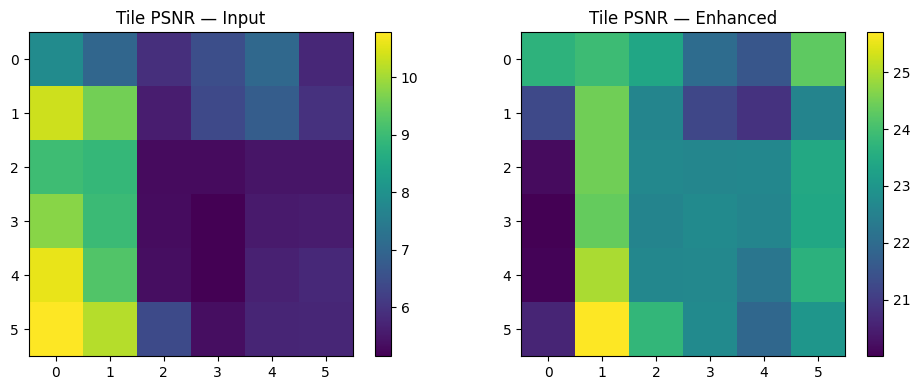

In [49]:
import numpy as np, matplotlib.pyplot as plt, tensorflow as tf

def psnr(a,b): return float(tf.image.psnr(a,b, max_val=1.0).numpy())

def tile_psnr_map(pred, gt, tiles=6):
    H,W,_ = pred.shape
    th, tw = H//tiles, W//tiles
    M = np.zeros((tiles, tiles))
    for i in range(tiles):
        for j in range(tiles):
            p = pred[i*th:(i+1)*th, j*tw:(j+1)*tw]
            g = gt  [i*th:(i+1)*th, j*tw:(j+1)*tw]
            M[i,j] = psnr(p,g)
    return M

M_in  = tile_psnr_map(low.numpy(), gt.numpy())
M_out = tile_psnr_map(out.numpy(), gt.numpy())

fig, axs = plt.subplots(1,2, figsize=(10,4))
im0 = axs[0].imshow(M_in, cmap="viridis");  axs[0].set_title("Tile PSNR — Input");     plt.colorbar(im0, ax=axs[0], fraction=0.046)
im1 = axs[1].imshow(M_out, cmap="viridis"); axs[1].set_title("Tile PSNR — Enhanced");  plt.colorbar(im1, ax=axs[1], fraction=0.046)
plt.tight_layout(); plt.show()


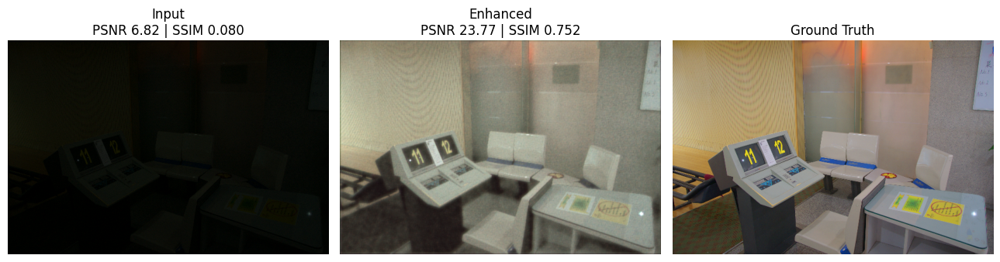

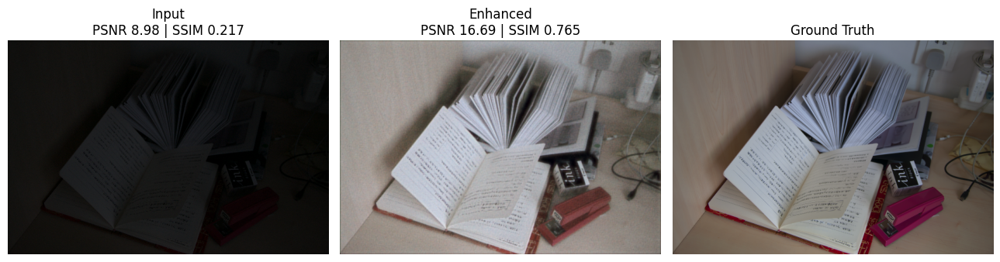

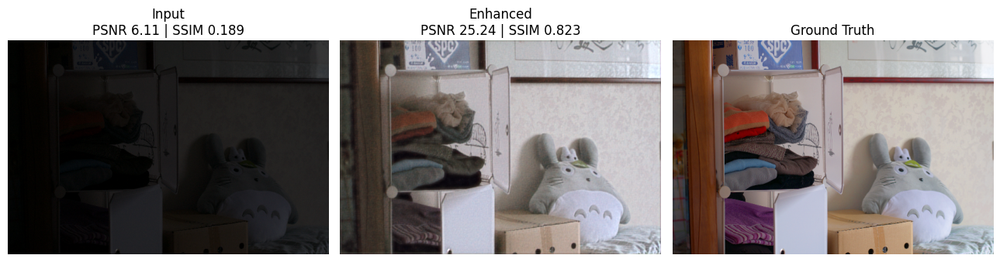

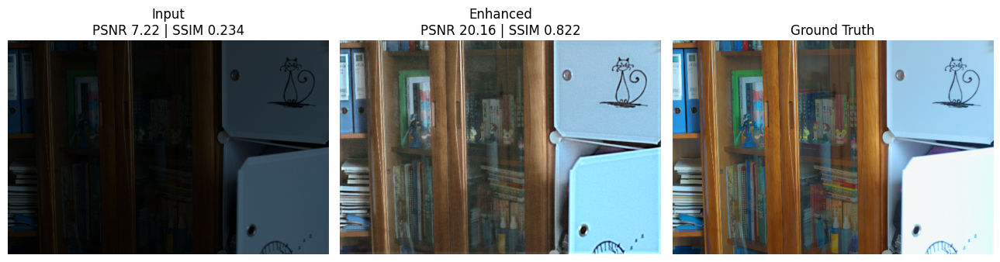

In [50]:
import random, matplotlib.pyplot as plt, tensorflow as tf, numpy as np, os
from glob import glob

def ssim(a,b): return float(tf.image.ssim(a,b, max_val=1.0).numpy())

pairs = list(zip(sorted(glob(os.path.join(TEST_LOW, "*"))),
                 sorted(glob(os.path.join(TEST_HIGH, "*")))))
sample = random.sample(pairs, min(4, len(pairs)))

for low_p, gt_p in sample:
    low = load_img(low_p); gt = load_img(gt_p); out = predict_img(model, low)
    in_psnr, in_ssim   = psnr(low, gt), ssim(low, gt)
    out_psnr, out_ssim = psnr(out, gt), ssim(out, gt)

    fig, axs = plt.subplots(1,3, figsize=(13,4))
    axs[0].imshow(low); axs[0].set_title(f"Input\nPSNR {in_psnr:.2f} | SSIM {in_ssim:.3f}"); axs[0].axis("off")
    axs[1].imshow(out); axs[1].set_title(f"Enhanced\nPSNR {out_psnr:.2f} | SSIM {out_ssim:.3f}"); axs[1].axis("off")
    axs[2].imshow(gt);  axs[2].set_title("Ground Truth"); axs[2].axis("off")
    plt.tight_layout(); plt.show()


In [51]:
import time, numpy as np, tensorflow as tf
imgs = [load_img(p) for p in sorted(glob(os.path.join(TEST_LOW, "*")))[:8]]

# Warmup
_ = model.predict(tf.expand_dims(imgs[0],0), verbose=0)

times = []
for im in imgs:
    t0 = time.time()
    _ = model.predict(tf.expand_dims(im,0), verbose=0)
    times.append((time.time()-t0)*1000.0)

print(f"Inference time: mean={np.mean(times):.1f} ms | std={np.std(times):.1f} | min={np.min(times):.1f} | max={np.max(times):.1f}")


Inference time: mean=496.8 ms | std=1.9 | min=494.6 | max=500.0


In [54]:
params = model.count_params()
print(f"Total parameters: {params:,}")

# (Optional) Save model size on disk (keras format)
tmp_path = "/content/enhancement_model.keras"
model.save(tmp_path)
import os
size_mb = os.path.getsize(tmp_path) / (1024*1024)
print(f"Serialized size (~): {size_mb:.2f} MB")


Total parameters: 44,157,007
Serialized size (~): 172.62 MB


Autocontrast  - PSNR: 11.786685943603516  SSIM: 0.5007877945899963
MIRNet (yours)- PSNR: 20.15888786315918  SSIM: 0.8221669793128967


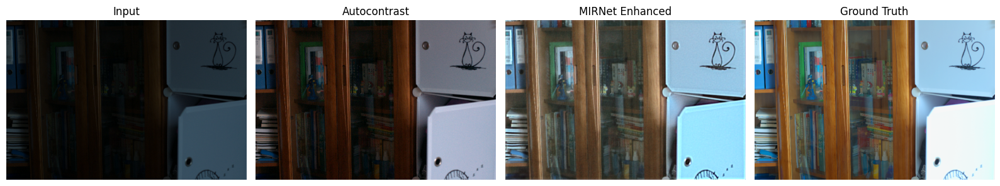

In [56]:
from PIL import Image, ImageOps
import numpy as np
import tensorflow as tf

def pil_to_tf(img_pil):
    arr = np.array(img_pil, dtype=np.float32) / 255.0
    return tf.convert_to_tensor(arr)

# Take one pair from your eval set
low_p, gt_p = pairs[0]
low = load_img(low_p)   # tf.Tensor [H,W,3], float32 in [0,1]
gt  = load_img(gt_p)

# Convert low to PIL for autocontrast
low_pil = Image.fromarray(np.uint8(low.numpy() * 255.0))
auto_pil = ImageOps.autocontrast(low_pil)
auto = pil_to_tf(auto_pil)

# Predict with your model
out = predict_img(model, low)

# Clamp just in case
def clamp01(x): return tf.clip_by_value(x, 0.0, 1.0)

print("Autocontrast  - PSNR:", psnr(clamp01(auto), gt),  " SSIM:", ssim(clamp01(auto), gt))
print("MIRNet (yours)- PSNR:", psnr(out, gt),            " SSIM:", ssim(out, gt))

# Optional: visualize side by side
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1,4, figsize=(16,4))
axs[0].imshow(low); axs[0].set_title("Input"); axs[0].axis("off")
axs[1].imshow(auto); axs[1].set_title("Autocontrast"); axs[1].axis("off")
axs[2].imshow(out); axs[2].set_title("MIRNet Enhanced"); axs[2].axis("off")
axs[3].imshow(gt); axs[3].set_title("Ground Truth"); axs[3].axis("off")
plt.tight_layout(); plt.show()
